# A Tangle Analysis in Health

The aim of this notebook is to find tangles in the [Health Diabetes Indicators Dataset](https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset/data). It performs the analysis in the context of a bachelorthesis regarding the applications of tangle theory. This notebooks encodes the data, orders the features with the ratio cut order function, builds up a tangle search tree by the extending-tangles algorithm, calculates the association coefficient of the tangles to measure their association with diabetes, implements the condensing-tangles algorithm and applies it on tangles that are highly associated with diabetes. At the end, the condensed tangles are examined different branches of the tree are plotted as tangle matrices. The overall result is a manually created decision tree that reflects the structure of the condensed tangles in the tangle search tree and that aims to find tangles of a high diabetes risk.

In [28]:
# import relevant modules and read in the dataframe
import pandas as pd
import numpy as np
import math as m
import matplotlib.pyplot as plt
import seaborn as sns
import tangles
import warnings
warnings.filterwarnings("ignore")
from tangles.search import TangleSweep
from tangles.util.graph.cut_weight import ratiocut_order, ncut_order
from tangles.util.tree import BinTreeNode
from tangles.util._subsets import all_subsets
from tangles._typing import OrientedSep
from tangles import Tangle 
from typing import Optional



df = pd.read_csv(r'/Users/kaiglantz/Documents/Uni Hamburg/Bachelorarbeit/diabetes_012_health_indicators_BRFSS2015.csv')

df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


# Encode the variables

The variables HighBP, HighChol, DiffWalk and HeartDiseaseorAttack are already binary features and GenHlth, PhysHlth, Age and Income are ordinal. More information about the scale is provided in the [Codebook](https://www.cdc.gov/brfss/annual_data/2015/pdf/codebook15_llcp.pdf). BMI is the only numerical variable and will be encoded using official [tresholds](https://en.wikipedia.org/wiki/Body_mass_index). The encoding of the variables is the same as in the [Survey Tangles example](https://tangle-software.github.io/tangles/tutorials/Survey%20Tangles.html).

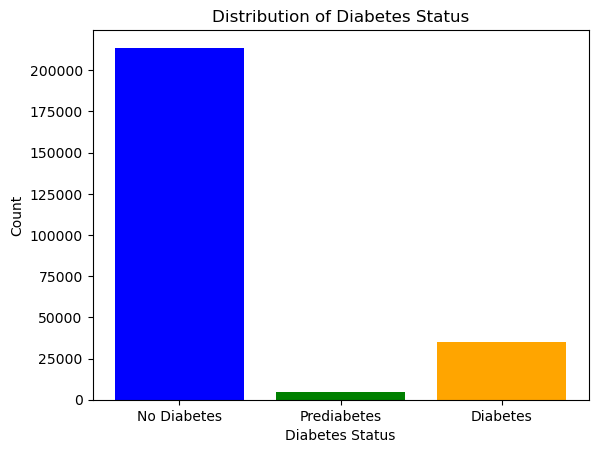

In [29]:
# encode diabetes variable
# the diabetes column contains either 0(diabetes), 1(prediabetes) or 2(diabetes) and will be dummy encoded
df_encoded = pd.get_dummies(df, columns=['Diabetes_012'], prefix='diabetes')
for column_name in ['diabetes_0.0', 'diabetes_1.0', 'diabetes_2.0']:
    df_encoded[column_name] = np.where(df_encoded[column_name] == 1, 1, -1)


# Create a bar chart
diabetes_counts = df['Diabetes_012'].value_counts()
colors = ['blue', 'orange', 'green']
plt.bar(diabetes_counts.index, diabetes_counts.values, color=colors)

# Adding labels
plt.xlabel('Diabetes Status')
plt.ylabel('Count')
plt.title('Distribution of Diabetes Status')
plt.xticks([0, 1, 2], ['No Diabetes', 'Prediabetes', 'Diabetes'])

# Show plot
plt.show()

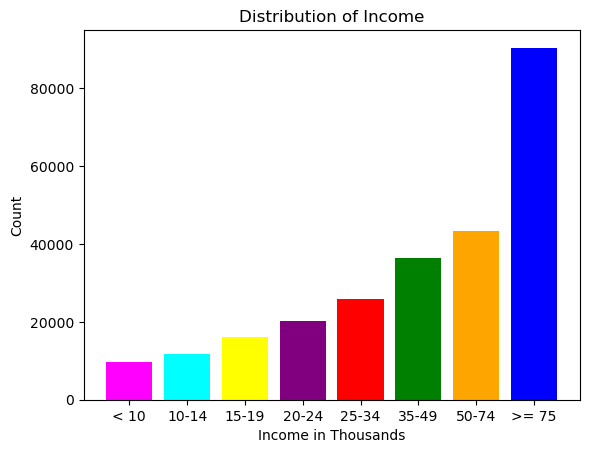

In [30]:
# encode Income
# Income is an ordinal variable with values ranging from 1 to 8 (US Dollars)

thresholds = [2,3,4,5,6,7,8]
income = ['>10000', '>15000', '>20000', '>25000', '>35000', '>50000', '>75000']

for threshold, name in zip(thresholds, income):
    df_encoded['income_' + name] = np.where(df_encoded['Income'] >= threshold, 1, -1)


# Create a bar chart
income_counts = df['Income'].value_counts()
colors = ['blue', 'orange', 'green', 'red', 'purple', 'yellow', 'cyan', 'magenta']
plt.bar(income_counts.index, income_counts.values, color=colors)

# Adding labels
plt.xlabel('Income in Thousands')
plt.ylabel('Count')
plt.title('Distribution of Income')
plt.xticks([1,2,3,4,5,6,7,8], ['< 10', '10-14', '15-19', '20-24', '25-34', '35-49', '50-74', '>= 75'])

# Show plot
plt.show()


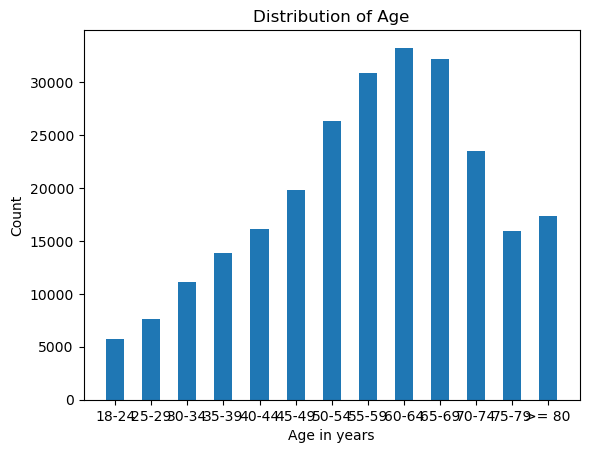

In [31]:
# encode Age
# Age is ordinal with values ranging from 1 to 13

thresholds = [2,3,4,5,6,7,8,9,10,11,12,13]
age = ['>24', '>29', '>34', '>39', '>44', '>49', '>54', '>59', '>64', '>69', '>74', '>79']

for threshold, name in zip(thresholds, age):
    df_encoded['age_' + name] = np.where(df_encoded['Age'] >= threshold, 1, -1)

# Create a bar chart
age_counts = df['Age'].value_counts()
plt.bar(age_counts.index, age_counts.values, width=0.5)

# Adding labels
plt.xlabel('Age in years')
plt.ylabel('Count')
plt.title('Distribution of Age')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13], ['18-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '>= 80'])

# Show plot
plt.show()

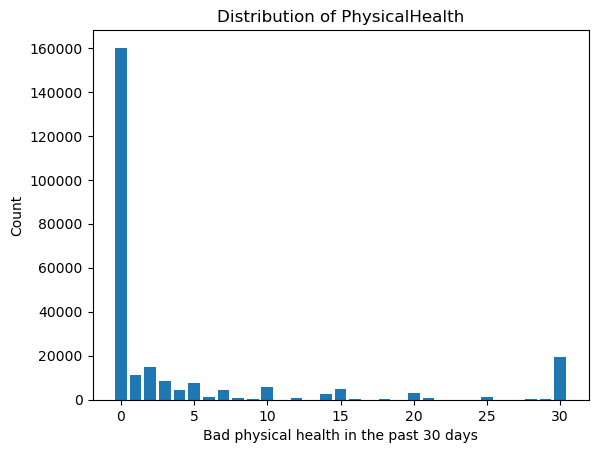

In [32]:
# encode PhysicalHealth
# Describes for how many days during the past 30 days was the physical health, which includes physical illness and injury, not good

thresholds = [5,10,15,20,25]
p_health = ['>4', '>9', '>14', '>19', '>24']

for threshold, name in zip(thresholds, p_health):
    df_encoded['physhlth_' + name] = np.where(df_encoded['PhysHlth'] >= threshold, 1, -1)


# Create a bar chart
p_health_counts = df['PhysHlth'].value_counts()
plt.bar(p_health_counts.index, p_health_counts.values)

# Adding labels
plt.xlabel('Bad physical health in the past 30 days')
plt.ylabel('Count')
plt.title('Distribution of PhysicalHealth')


# Show plot
plt.show()

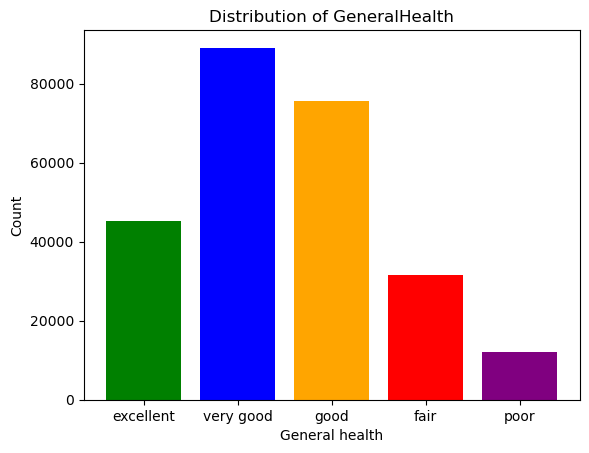

In [33]:
# encode GeneralHealth
# GeneralHealth is ordinal with values ranging from 1(excellent) to 5(poor)
thresholds = [2,3,4,5]
g_health = ['good', 'middle', 'fair', 'poor']

for threshold, name in zip(thresholds, g_health):
    df_encoded['genhlth_' + name] = np.where(df_encoded['GenHlth'] >= threshold, 1, -1)


# Create a bar chart
g_health_counts = df['GenHlth'].value_counts()
colors = ['blue', 'orange', 'green', 'red', 'purple']
plt.bar(g_health_counts.index, g_health_counts.values, color=colors)

# Adding labels
plt.xlabel('General health')
plt.ylabel('Count')
plt.title('Distribution of GeneralHealth')
plt.xticks([1,2,3,4,5], ['excellent', 'very good', 'good', 'fair', 'poor'])

# Show plot
plt.show()

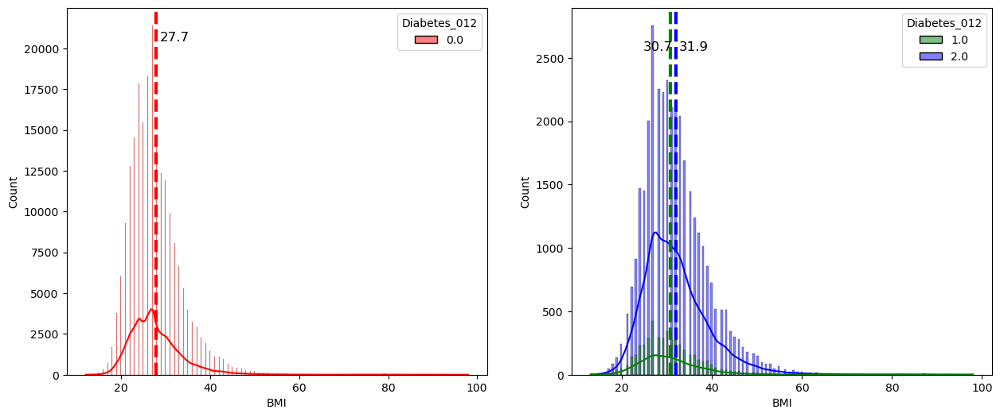

In [34]:
# encode BMI
thresholds = [18.5, 25, 30]
bmi = ['normal_weight', 'overweight', 'obese']

for threshold, name in zip(thresholds, bmi):
    df_encoded[name] = np.where(df_encoded['BMI'] >= threshold, 1, -1)


# plot distribution of BMI with means for each diabetes type
fig = plt.figure(figsize=(15, 6))
ax1 = fig.add_subplot(1,2,1)
sns.histplot(data=df.loc[(df.Diabetes_012==0)], x="BMI", hue="Diabetes_012", kde=True, palette=["red"], ax=ax1)
plt.axvline(df.loc[df.Diabetes_012==0].BMI.mean(), color="r", linestyle="dashed", linewidth=3)
ax1.annotate("{:.1f}".format(df.loc[df.Diabetes_012==0].BMI.mean()), xy=(32,20000), 
             ha="center", va="center", xytext=(0, 10), textcoords="offset points", fontsize=12)
ax2 = fig.add_subplot(1,2,2)
sns.histplot(data=df.loc[(df.Diabetes_012>0)], x="BMI", hue="Diabetes_012", kde=True, palette=["green", "blue"], ax=ax2)
plt.axvline(df.loc[df.Diabetes_012==1].BMI.mean(), color="g", linestyle="dashed", linewidth=3)
ax2.annotate("{:.1f}".format(df.loc[df.Diabetes_012==1].BMI.mean()), xy=(28,2500), 
             ha="center", va="center", xytext=(0, 10), textcoords="offset points", fontsize=12)
plt.axvline(df.loc[df.Diabetes_012==2].BMI.mean(), color="b", linestyle="dashed", linewidth=3)
ax2.annotate("{:.1f}".format(df.loc[df.Diabetes_012==2].BMI.mean()), xy=(36,2500), 
             ha="center", va="center", xytext=(0, 10), textcoords="offset points", fontsize=12)
plt.show()

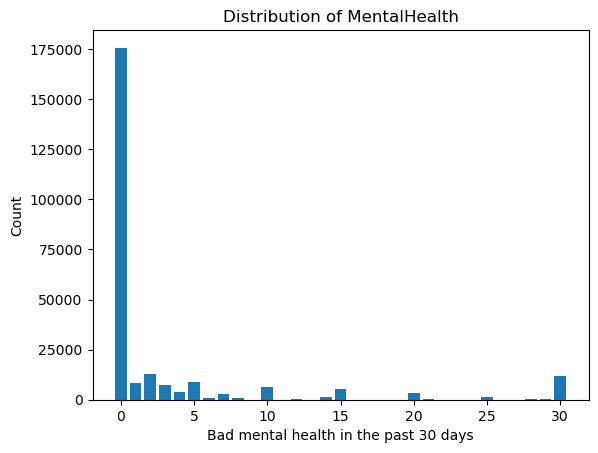

In [35]:
# encode MentalHealth
# Describes for how many days during the past 30 days was the mental health, which includes stress, depression, and problems with emotions, not good

thresholds = [5,10,15,20,25]
m_health = ['>4', '>9', '>14', '>19', '>24']

for threshold, name in zip(thresholds, p_health):
    df_encoded['menthlth_' + name] = np.where(df_encoded['MentHlth'] >= threshold, 1, -1)


# Create a bar chart
m_health_counts = df['MentHlth'].value_counts()
plt.bar(m_health_counts.index, m_health_counts.values)

# Adding labels
plt.xlabel('Bad mental health in the past 30 days')
plt.ylabel('Count')
plt.title('Distribution of MentalHealth')


# Show plot
plt.show()

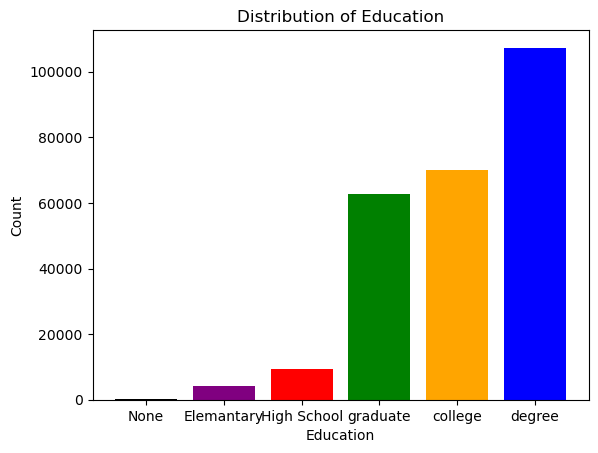

<Figure size 5000x480 with 0 Axes>

In [36]:
# encode Education
thresholds = [2, 4, 6]
bmi = ['elemantary', 'highschool', 'college']

for threshold, name in zip(thresholds, bmi):
    df_encoded[name] = np.where(df_encoded['Education'] >= threshold, 1, -1)

# Create a bar chart
education_counts = df['Education'].value_counts()
colors = ['blue', 'orange', 'green', 'red', 'purple', 'black']
plt.bar(education_counts.index, education_counts.values, color=colors)

# Adding labels
plt.xlabel('Education')
plt.ylabel('Count')
plt.title('Distribution of Education')
plt.xticks([1,2,3,4,5,6], ['None', 'Elemantary', 'High School', 'graduate', 'college', 'degree'])
#plt.figure(figsize=(100,100))
plt.figure().set_figwidth(50)

# Show plot
plt.show()



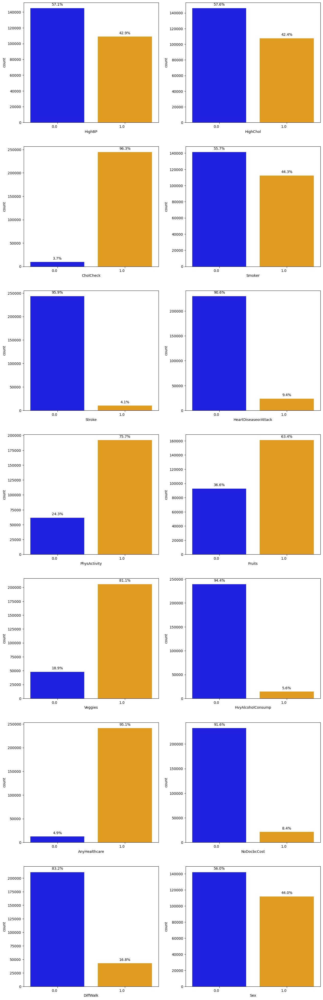

In [37]:
# drop not encoded columns
df_encoded.drop(['BMI', 'GenHlth', 'PhysHlth','MentHlth','Education', 'Age', 'Income'], axis=1, inplace=True)

# encode binary features with 1 and -1
for column_name in ['HighBP', 'HighChol', 'HeartDiseaseorAttack', 'DiffWalk', "CholCheck", "Smoker", "Stroke", 
"PhysActivity", "Fruits", "Veggies", "HvyAlcoholConsump", "AnyHealthcare", "NoDocbcCost", 'Sex', 'diabetes_0.0', 'diabetes_1.0', 'diabetes_2.0']:
    df_encoded[column_name] = np.where(df_encoded[column_name] == 1, 1, -1)

cols = ["HighBP", "HighChol", "CholCheck", "Smoker", "Stroke", "HeartDiseaseorAttack", "PhysActivity", "Fruits", "Veggies",
       "HvyAlcoholConsump", "AnyHealthcare", "NoDocbcCost", "DiffWalk", "Sex"]
ncols = 2
nrows = m.ceil(len(df[cols].columns)/ncols)
fig = plt.figure(figsize=(15,50))
fig.tight_layout(pad=7.0)
count = 0
for i in range(nrows):
    for j in range(ncols):
        if len(df[cols].columns) > i+j+count:
            ax = fig.add_subplot(nrows, ncols, i+j+count+1)
            sns.countplot(x=df[cols].iloc[:, i+j+count], # order=df[cols].iloc[:, i+j+count].value_counts().index, 
                          data=df[cols], ax=ax, palette=['blue', 'orange'])
            ax.set_xticklabels(ax.get_xticklabels(), horizontalalignment="right", size=10)
            ax.set_yticklabels(ax.get_yticklabels(), horizontalalignment="right", size=10)
            for p in ax.patches:
                total = len(df[cols].iloc[:, i+j+count])
                percentage = "{:.1f}%".format(100 * p.get_height() / total);
                ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()),
                            ha="center", va="center", xytext=(0, 10), textcoords="offset points", fontsize=10)
    count += 1 
plt.show()

In [38]:
df_encoded.head()

,HighBP,HighChol,CholCheck,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,...,overweight,obese,menthlth_>4,menthlth_>9,menthlth_>14,menthlth_>19,menthlth_>24,elemantary,highschool,college
0,1,1,1,1,-1,-1,-1,-1,1,-1,...,1,1,1,1,1,-1,-1,1,1,-1
1,-1,-1,-1,1,-1,-1,1,-1,-1,-1,...,1,-1,-1,-1,-1,-1,-1,1,1,1
2,1,1,1,-1,-1,-1,-1,1,-1,-1,...,1,-1,1,1,1,1,1,1,1,-1
3,1,-1,1,-1,-1,-1,1,1,1,-1,...,1,-1,-1,-1,-1,-1,-1,1,-1,-1
4,1,1,1,-1,-1,-1,1,1,1,-1,...,-1,-1,-1,-1,-1,-1,-1,1,1,-1


# Order the features with the ratio cut order
We first create a similarity matrix based on a sample of 20000 survey participants. We then use the ratio cut order to order the features.


### Sample Data

Choose the first 20000 rows as a sample.

In [39]:
# sample with the first 20000 rows
sample_data = df_encoded.iloc[:20000]

# create a numpy dataframe and a list of feature names
dt = sample_data.to_numpy()
feature_names = sample_data.columns.tolist()


### Create the similarity matrix

This similarity measure is the count of same answers two persons gave.

In [40]:
# unbiased similarity matrix like in the book, chapter 9 page 120

# Compute the similarity matrix, as we just have values in {1,-1}, 
# the dot product will give us the sum of agreements minus the sum of disagreements
similarity_matrix = dt @ dt.T

# Since we want the number of agreements, we need to add the number of questions and divide by 2 
num_questions = dt.shape[1]
similarity_matrix= (similarity_matrix+ num_questions) // 2

# sanity check
all_whole_numbers = np.all(np.equal(similarity_matrix, similarity_matrix.astype(int)))
print('All numbers whole in similarity matrix: ', all_whole_numbers)
print('row 0: ', dt[0])
print('row 1: ', dt[1])
print('similarity row 0 and 1: ', np.sum(dt[0] == dt[1]))
print('similarity matrix at [0,1]: ', similarity_matrix[0,1])
print('similarity row 10 and 11: ', np.sum(dt[10] == dt[11]))
print('similarity matrix at [10,11]: ', similarity_matrix[10,11])
print('similarity row 1000 and 2000: ', np.sum(dt[1000] == dt[2000]))
print('similarity matrix at [1000,2000]: ', similarity_matrix[1000,2000])




All numbers whole in similarity matrix:  True
row 0:  [ 1  1  1  1 -1 -1 -1 -1  1 -1  1 -1  1 -1  1 -1 -1  1  1 -1 -1 -1 -1 -1
  1  1  1  1  1  1  1  1 -1 -1 -1 -1  1  1  1 -1 -1  1  1  1  1  1  1  1
  1  1  1 -1 -1  1  1 -1]
row 1:  [-1 -1 -1  1 -1 -1  1 -1 -1 -1 -1  1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1
  1  1  1  1  1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1  1 -1 -1  1  1 -1
 -1 -1 -1 -1 -1  1  1  1]
similarity row 0 and 1:  34
similarity matrix at [0,1]:  34
similarity row 10 and 11:  32
similarity matrix at [10,11]:  32
similarity row 1000 and 2000:  51
similarity matrix at [1000,2000]:  51


### Ratio cut order

We use the ratio cut order to order the features. We leave out the features which encode the diabetes question as we later use them to measure the association of a tangle with diabetes.

([<matplotlib.axis.XTick at 0x183bb3cb0>,
 [Text(0, 0, 'genhlth_poor'),
  Text(1, 0, 'menthlth_>24'),
  Text(2, 0, 'physhlth_>24'),
  Text(3, 0, 'menthlth_>19'),
  Text(4, 0, 'physhlth_>19'),
  Text(5, 0, 'physhlth_>14'),
  Text(6, 0, 'menthlth_>14'),
  Text(7, 0, 'income_>10000'),
  Text(8, 0, 'physhlth_>9'),
  Text(9, 0, 'elemantary'),
  Text(10, 0, 'menthlth_>9'),
  Text(11, 0, 'income_>15000'),
  Text(12, 0, 'genhlth_fair'),
  Text(13, 0, 'income_>20000'),
  Text(14, 0, 'DiffWalk'),
  Text(15, 0, 'physhlth_>4'),
  Text(16, 0, 'Stroke'),
  Text(17, 0, 'menthlth_>4'),
  Text(18, 0, 'income_>25000'),
  Text(19, 0, 'NoDocbcCost'),
  Text(20, 0, 'age_>24'),
  Text(21, 0, 'highschool'),
  Text(22, 0, 'HeartDiseaseorAttack'),
  Text(23, 0, 'age_>29'),
  Text(24, 0, 'income_>35000'),
  Text(25, 0, 'age_>34'),
  Text(26, 0, 'AnyHealthcare'),
  Text(27, 0, 'age_>79'),
  Text(28, 0, 'age_>39'),
  Text(29, 0, 'normal_weight'),
  Text(30, 0, 'age_>44'),
  Text(31, 0, 'age_>74'),
  Text(32, 0, '

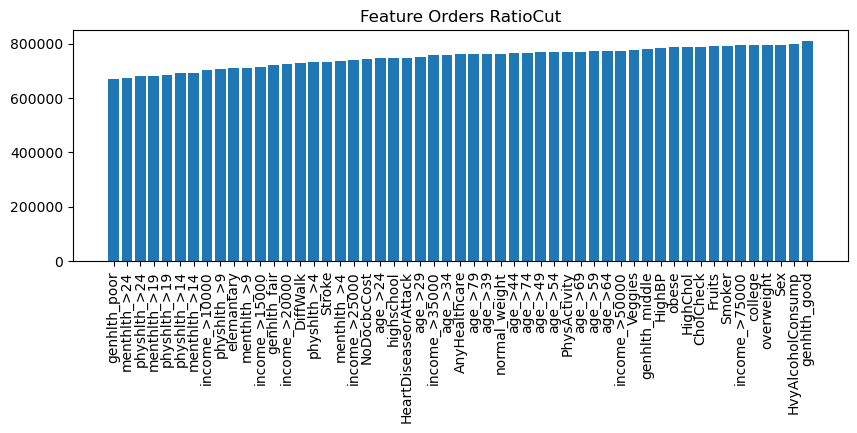

In [41]:
from tangles.util.graph.cut_weight import ratiocut_order

# sample with the first 20000 rows and drop diabetes features as we will use them later
sample_data = df_encoded.drop(columns=['diabetes_0.0', 'diabetes_1.0', 'diabetes_2.0']).copy().iloc[:20000]

# create a numpy dataframe and a list of feature names
dt = sample_data.to_numpy()
feature_names = sample_data.columns.tolist()

# create ratio cut order function based on the similarity matrix and order the features
rat_order = ratiocut_order(similarity_matrix)
ratio = rat_order(dt)

# features, sorted lowest to highest order
sorted_features_ratio = []
for i in np.argsort(ratio):
    sorted_features_ratio.append(feature_names[i])

# orders, sorted from lowest to highest order
sorted_order_ratio = np.sort(ratio)

# plot the orders of the features sorted from lowest to highest
plt.figure(figsize=(10,3))
plt.bar(range(len(sorted_order_ratio)), sorted_order_ratio)
plt.title(f'Feature Orders RatioCut')
plt.xticks(range(len(sorted_features_ratio)), sorted_features_ratio, rotation=90)


# Feature system
Create a feature systems with features ordered by the ratio cut order

In [42]:
# Ratio cut order

# append the feature diabetes_2.0 to the feature system to check on association with diabetes later
sorted_features_ratio.append('diabetes_2.0')

# create dataframe with columns (features) ordered by the ratio cut order
df_ratio = df_encoded[sorted_features_ratio].copy()
print('length of the features (number of survey participants): ', len(df_ratio))

# create an array with feature names and another array with the features
metadata_ratio = df_ratio.columns.to_numpy()
features_ratio = df_ratio.to_numpy()

# create the feature system
S_ratio = tangles.separations.FeatureSystem(len(df_ratio))
S_ratio.add_seps(features_ratio, metadata_ratio)

# check if the feature ids are in the right order
for e in range(len(S_ratio.all_feature_ids())):
    print(S_ratio.feature_metadata(S_ratio.all_feature_ids())[e].info)

length of the features (number of survey participants):  253680
genhlth_poor
menthlth_>24
physhlth_>24
menthlth_>19
physhlth_>19
physhlth_>14
menthlth_>14
income_>10000
physhlth_>9
elemantary
menthlth_>9
income_>15000
genhlth_fair
income_>20000
DiffWalk
physhlth_>4
Stroke
menthlth_>4
income_>25000
NoDocbcCost
age_>24
highschool
HeartDiseaseorAttack
age_>29
income_>35000
age_>34
AnyHealthcare
age_>79
age_>39
normal_weight
age_>44
age_>74
age_>49
age_>54
PhysActivity
age_>69
age_>59
age_>64
income_>50000
Veggies
genhlth_middle
HighBP
obese
HighChol
CholCheck
Fruits
Smoker
income_>75000
college
overweight
Sex
HvyAlcoholConsump
genhlth_good
diabetes_2.0


# Extending-tangles algorithm

Use the method greedy search in the class TangleSweep to extend the tangle search tree in four iterations.

### First iteration
Run the first iteration to get the leaves (not extended tangles of the tree after the first iteration) of the tree to continue with the following three iterations. The leaves are stored in the variable max_tangles_ratio.

In [44]:
# create the agreement function and the TangleSweep
Afunc_ratio = tangles.agreement_func(S_ratio)

# put in all features except diabetes_2.0
TSweep_ratio = tangles.TangleSweep(Afunc_ratio, S_ratio.is_le, sep_ids=S_ratio.all_feature_ids()[:-1], forbidden_tuple_size=3)

# greedy search to build up the tree
TSweep_ratio.greedy_search(max_width=1, start_node=TSweep_ratio.tree.root)


# create a matrix out of the maximal tangles in the tree
max_tangles_ratio = TSweep_ratio.tree.maximal_tangles()
tangle_matrix_ratio = BinTreeNode.to_indicator_matrix(max_tangles_ratio)
print('len of max tangles: ', len(max_tangles_ratio))

# print core and agreement of the maximal tangles
for i, tangle in enumerate(max_tangles_ratio):
    print(f'tangle {i}: ', tangle.core , ' agreement: ', tangle.agreement) 

# Turn features into a list
features_ratio = []
for e in range(len(S_ratio.all_feature_ids())):
    features_ratio.append(S_ratio.feature_metadata(S_ratio.all_feature_ids())[e].info)

# plot the tangle matrix
plt.figure(figsize=(70, 150))
plt.imshow(tangle_matrix_ratio, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()

len of max tangles:  54
tangle 0:  {(0, 1)}  agreement:  12081.0
tangle 1:  {(1, 1), (0, -1)}  agreement:  10340.0
tangle 2:  {(2, 1), (0, -1), (1, -1)}  agreement:  10708.0
tangle 3:  {(3, 1), (2, -1), (0, -1), (1, -1)}  agreement:  2948.0
tangle 4:  {(2, -1), (0, -1), (3, -1), (4, 1)}  agreement:  3101.0
tangle 5:  {(4, -1), (5, 1), (0, -1), (3, -1)}  agreement:  4361.0
tangle 6:  {(6, 1), (5, -1), (0, -1), (3, -1)}  agreement:  3651.0
tangle 7:  {(7, -1), (5, -1), (6, -1), (0, -1)}  agreement:  5596.0
tangle 8:  {(7, 1), (8, 1), (5, -1), (6, -1), (0, -1)}  agreement:  7471.0
tangle 9:  {(8, -1), (7, 1), (9, -1), (6, -1), (0, -1)}  agreement:  102.0
tangle 10:  {(8, -1), (7, 1), (10, 1), (9, 1), (6, -1), (0, -1)}  agreement:  5319.0
tangle 11:  {(8, -1), (7, 1), (10, -1), (9, 1), (0, -1), (11, -1)}  agreement:  7309.0
tangle 12:  {(11, 1), (8, -1), (12, 1), (10, -1), (9, 1), (0, -1)}  agreement:  15085.0
tangle 13:  {(11, 1), (13, -1), (8, -1), (10, -1), (9, 1), (12, -1)}  agreement:

### Implement relevant functions
The function results_greedy_search_in_subtree_three_iterations() performs the second to fourth iteration of the extending-tangles algorithm and receives the results of the first iteration, stored in the variable max_tangles_ratio, as an input. The function get_agreement_for_oriented_sep() serves as a help function for the function get_diabetes_association_for_tangles() which returns the association coefficients of a list of tangles with diabetes.

In [62]:
def results_greedy_search_in_subtree_three_iterations(TSweep: TangleSweep, initial_tangle: tangle ,agreement: int, features: list, show_results: bool=False):
    """Run three iterations of greedy searches on leaves of a first, initial greedy search that have a certain agreement value.

    Parameters
    ----------
    TSweep : TangleSweep
        The TangleSweep we want to use.
    initial_tangle: tangle
        The initial tangle which is the root of the subtree in which all greedy search iterations are performed.
    agreement: int
        The agreement value of the nodes that we want to use for the greedy search iterations
    features: list
        A list with names of the features in the right order to plot the matrix
    
    Returns
    -------
    list
        All maximal tangles of at least the specified agreement value after the two iterations.
    """ 
    # greedy search with initial start node
    TSweep.greedy_search(max_width=1,explore_agreement_lower_bound=agreement, start_node=initial_tangle)

    # get the leaves of this first greedy search to start the first iteration of greedy searches with them as start nodes
    max_tangles = initial_tangle.leaves_in_subtree(agreement=agreement)

    # first iteration
    for tangle in max_tangles:
        TSweep_ratio.greedy_search(max_width=1,explore_agreement_lower_bound=agreement, start_node=tangle)
        first_iteration_tangles = tangle.leaves_in_subtree(agreement=agreement)

        # second iteration
        for next_tangle in first_iteration_tangles:
            TSweep_ratio.greedy_search(max_width=1,explore_agreement_lower_bound=agreement, start_node=next_tangle)


    # get all maximal tangles of the subtree of the initial start node after running both iterations
    max_tangles_final = initial_tangle.leaves_in_subtree(agreement=agreement) 
    
    # create a tangle matrix to visualize these tangles
    tangle_matrix = BinTreeNode.to_indicator_matrix(max_tangles_final)

    print('len of max tangles: ', len(max_tangles_final))

    if show_results:
        i = 0
        for tangle in max_tangles_final:
            print(f'tangle {i}: ', tangle.core , ' agreement: ', tangle.agreement) 
            i += 1

        # plot the tangle matrix
        plt.figure(figsize=(70, 150))
        plt.imshow(tangle_matrix, cmap='viridis', interpolation='nearest')
        plt.colorbar(label='Values')
        plt.xlabel('features')
        plt.ylabel('tangles')
        plt.xticks(np.arange(len(features)), features, rotation=90)
        plt.title('Tangles matrix with features')
        plt.show()  

    return max_tangles_final

def get_agreement_for_oriented_sep(TSweep: TangleSweep, tangles: list[tangle], add_seps: set[OrientedSep]):
    """The function returns a list with agreement values for a list of tangles, if we would add certain features to the tangles.

    Parameters
    ----------
    TSweep : TangleSweep
        The TangleSweep we want to use.
    tangles: list
        The list of tangles that we want to add the oriented seperations to.
    add_seps: set
        The set of oriented seperations that we want to add to the tangles
    
    Returns
    -------
    list
        All agreement values of the tangles that they would have if the oriented seperations would have been added to them.
    """ 
    tail = np.empty((len(add_seps), 2), dtype=int)
    tail[:, :] = list(add_seps)
    core_agreement = np.empty(len(tangles))
    for i, tangle in enumerate(tangles):
            core_agreement[i] = np.iinfo(int).max

    for subset_size in range(0, TSweep._algorithm._find_agreement._forbidden_tuple_size - len(add_seps) + 1):
        subsets, inclusions = all_subsets(
            [tangle.core for tangle in tangles], subset_size
        )
        new_core_agreement = TSweep._algorithm._find_agreement._calculate_subset_agreements(
            subsets, inclusions, tail
        )
        core_agreement = np.minimum(core_agreement, new_core_agreement)

    return core_agreement

# def get_diabetes_tangles(TSweep: TangleSweep, tangles: list[tangle], features: list, quantity: int=20):
def get_diabetes_association_for_tangles(TSweep: TangleSweep, tangles: list[tangle], features: list):
    """The function returns a list with association coefficients regarding diabetes for a list of tangles.

    Parameters
    ----------
    TSweep : TangleSweep
        The TangleSweep we want to use.
    tangles: list
        The list of tangles that we want to add the oriented seperations to.
    features: list
        A list of features
    
    Returns
    -------
    list
        All association coefficients of the tangles.
    """ 
    # get agreement value for diabetes
    diabetes_agreement = np.array(get_agreement_for_oriented_sep(TSweep=TSweep, tangles=tangles, add_seps={(53,1)}))

    # get agreement value for no diabetes
    non_diabetes_agreement = np.array(get_agreement_for_oriented_sep(TSweep=TSweep, tangles=tangles, add_seps={(53,-1)}))

    # get association coefficients for the tangles
    association = diabetes_agreement / non_diabetes_agreement

    return list(association)


### Run the extending-tangles algorithm
Performs the second, third and fourth iteration of the extending-tangles algorithm. It stores all tangles found by the algorithm in the list tangles_all. It also creates a list association_all of association coefficients matching to the tangles in the list tangles_all.

In [63]:
# list for tangles and association coefficients of the tangles
tangles_all = []
association_all = []

# iterate over the leaves max_tangles_ratio which are the results of the first iteration of the extending-tangles algorithm
for i, tangle in enumerate(max_tangles_ratio):
    
    # performs the second to fourth iteration of the extending-tangles algorithm on a leave in max_tangles_ratio (it extends the subtree of this leave)
    resulting_tangles = results_greedy_search_in_subtree_three_iterations(TSweep= TSweep_ratio, initial_tangle= tangle,agreement=1000, features=features_ratio)

    # get association coefficients for the tangles
    assoc = get_diabetes_association_for_tangles(TSweep=TSweep_ratio, tangles=resulting_tangles, features=features_ratio)
    
    tangles_all.extend(resulting_tangles)
    association_all.extend(assoc)

    print(i, ': tangle appended: ', tangle.core)

len of max tangles:  659
0 : tangle appended:  {(0, 1)}
len of max tangles:  885
1 : tangle appended:  {(1, 1), (0, -1)}
len of max tangles:  1937
2 : tangle appended:  {(2, 1), (0, -1), (1, -1)}
len of max tangles:  812
3 : tangle appended:  {(3, 1), (2, -1), (0, -1), (1, -1)}
len of max tangles:  941
4 : tangle appended:  {(2, -1), (0, -1), (3, -1), (4, 1)}
len of max tangles:  1555
5 : tangle appended:  {(4, -1), (5, 1), (0, -1), (3, -1)}
len of max tangles:  1612
6 : tangle appended:  {(6, 1), (5, -1), (0, -1), (3, -1)}
len of max tangles:  293
7 : tangle appended:  {(7, -1), (5, -1), (6, -1), (0, -1)}
len of max tangles:  2407
8 : tangle appended:  {(7, 1), (8, 1), (5, -1), (6, -1), (0, -1)}
len of max tangles:  1
9 : tangle appended:  {(8, -1), (7, 1), (9, -1), (6, -1), (0, -1)}
len of max tangles:  1694
10 : tangle appended:  {(8, -1), (7, 1), (10, 1), (9, 1), (6, -1), (0, -1)}
len of max tangles:  1282
11 : tangle appended:  {(8, -1), (7, 1), (10, -1), (9, 1), (0, -1), (11, -1)

# Plot distribution of association coefficients
We can see three 'hills' in the diagram. The assumption here is that thet tangles of the right hill are strongly associated with diabetes and we use them to apply the condensing-tangles algorithm.

count of all association coefficient values:  33751


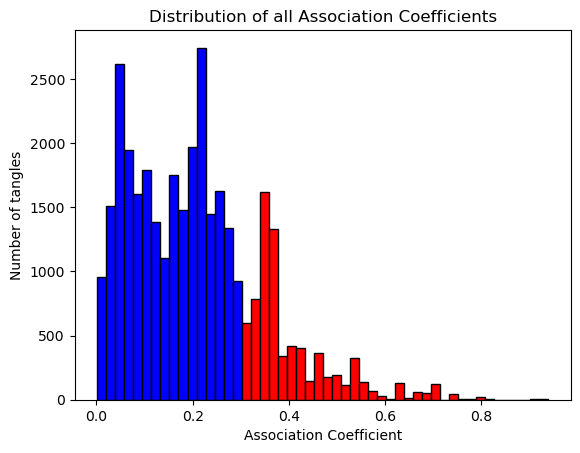

In [67]:
data_assoc = np.array(association_all)
data_tangles = np.array(tangles_all)

print('count of all association coefficient values: ', len(data_assoc))

# Create the histogram
n, bins, patches = plt.hist(data_assoc, bins=50, edgecolor='black')  # Adjust the number of bins as needed

# Color bars based on their position on the x-axis (bins)
for i in range(len(patches)):
    if bins[i] >= 0.3:  # Color red if the bin edge is greater than or equal to 0.3
        patches[i].set_facecolor('red')
    else:
        patches[i].set_facecolor('blue')


# Add labels and title
plt.xlabel('Association Coefficient')
plt.ylabel('Number of tangles')
plt.title('Distribution of all Association Coefficients')

# Show the plot
plt.show()


# Condensing-tangles algorithm

Runs the condensing-tangles algorithm on the tangles with association coefficient greater than or equal to 0.3 (marked as red in the distribution plot)

In [75]:
# help function for the condensing-tangles algorithm. Returns a sibling of a tangle in the tangle search tree
def get_sibling(tangle: Tangle)-> Optional[Tangle]:
        if not tangle.parent:
            return None

        if tangle == tangle.parent.left_child:
            return tangle.parent.right_child
        
        return tangle.parent.left_child

# relevant tangles are all tangles found by the extending-tangles algorithm that have an association coefficient of at least 0.3
indices = np.where(data_assoc >= 0.3)[0]
tangles_30 = data_tangles[indices]
relevant_tangles = set(tangles_30)
print('number of tangles with association coefficient of at least 0.3: ', len(relevant_tangles))

number of tangles with association coefficient of at least 0.3:  7587


### condesing tangles
Implements the condensing-tangles algorithm by iterationg over the levels of the tree, starting from the last level down to the first. The variable relevant_tangles will contain the condensed tangles after the last iteration.

In [76]:
# create a list with the levels of the tree
level_list = list(range(53, 0, -1))

# iterate over the levels
for i in level_list:

    # get all tangles of level i
    new_level =  set(TSweep_ratio.tree.k_tangles(k=i, agreement=1000))
    # get the intersection of the tangles of level i with the relevant tangles
    intersection = relevant_tangles.intersection(new_level)

    # go through the cases of the algorithm
    for tangle in intersection:

        sibling = get_sibling(tangle=tangle)

        if sibling:
            if (sibling in relevant_tangles) or (sibling.agreement < 1000):

                relevant_tangles.add(tangle.parent)
                relevant_tangles.discard(sibling)
                relevant_tangles.discard(tangle)
        else:
            relevant_tangles.add(tangle.parent)
            relevant_tangles.discard(tangle)
    # print(i, 'intersection: ', len(new_level))
    print(i, 'relevant tangles length: ', len(relevant_tangles))


53 relevant tangles length:  7587
52 relevant tangles length:  7587
51 relevant tangles length:  6386
50 relevant tangles length:  6386
49 relevant tangles length:  6128
48 relevant tangles length:  6122
47 relevant tangles length:  5641
46 relevant tangles length:  5213
45 relevant tangles length:  5213
44 relevant tangles length:  4842
43 relevant tangles length:  4570
42 relevant tangles length:  4433
41 relevant tangles length:  4433
40 relevant tangles length:  4342
39 relevant tangles length:  4329
38 relevant tangles length:  4280
37 relevant tangles length:  4192
36 relevant tangles length:  4116
35 relevant tangles length:  3979
34 relevant tangles length:  3916
33 relevant tangles length:  3916
32 relevant tangles length:  3896
31 relevant tangles length:  3896
30 relevant tangles length:  3896
29 relevant tangles length:  3896
28 relevant tangles length:  3892
27 relevant tangles length:  3892
26 relevant tangles length:  3892
25 relevant tangles length:  3875
24 relevant ta

### plot the condensed tangles

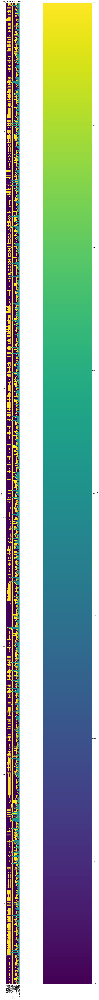

In [77]:
sibling_matrix = BinTreeNode.to_indicator_matrix(relevant_tangles)
# plot the tangle matrix
plt.figure(figsize=(70, 150))
plt.imshow(sibling_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 90')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show() 

### Sort the condensed tangles and plot them

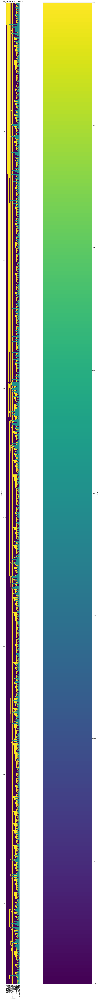

In [78]:
# Custom sorting function
def custom_sort_key(row):
    # Transform the row for sorting purposes, giving priority to 0, then 1, then -1
    # We'll map 0 -> 0, 1 -> 1, and -1 -> 2 for sorting
    return [0 if x == 1 else (1 if x == -1 else 2) for x in row]

# Sort the matrix based on the custom sort key
sorted_matrix = np.array(sorted(sibling_matrix, key=custom_sort_key))

# plot the tangle matrix
plt.figure(figsize=(70, 150))
plt.imshow(sorted_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()


# Interpretation
The rest of the notebook just plots different tangle matrices of different branches of the condensed tangles to better understand their structure and manually create a decision tree that reflects the structure of the condensed tangles in the tangle search tree. This structure should reveal what diabetes risk groups can be found in the data.

In [79]:
unique_features = np.unique(sorted_matrix[:,:2], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()


4


In [80]:
unique_features = np.unique(sorted_matrix[:,:3], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()


6


In [81]:
unique_features = np.unique(sorted_matrix[:,:4], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()


6


In [82]:
# check for strange tangle (fourth tangle in the matrix above)
strange = TSweep_ratio.tree.k_tangles(k=3, agreement=1000)
print(strange[4].core)
print(strange[4].agreement)
l = strange[4].leaves_in_subtree(1000)
print('leave agreement: ', l[0].agreement)
print('leave core: ', l[0].core)
print(len(l))
l_corr = get_diabetes_correlation_for_tangles(TSweep=TSweep_ratio, tangles=l, features=features_ratio)
l_corr

{(0, 1), (2, -1), (1, -1)}
3159.0
leave agreement:  1169.0
leave core:  {(0, 1), (11, 1), (8, -1), (10, -1), (9, 1)}
1


[0.7195876288659794]

In [83]:
# go into the subtree of the tangle (0,1), (1,-1), (2,1) as this is the only option on the (0,1)-side of the tree
subtree_matrix = sorted_matrix[(sorted_matrix[:, 0] == 1) & (sorted_matrix[:, 1] == -1) & (sorted_matrix[:, 2] == 1)]
print(len(subtree_matrix))
plt.figure(figsize=(70, 150))
plt.imshow(subtree_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()

85


In [84]:
# go into the subtree of the tangle (0,-1), (1,1)
subtree_matrix = sorted_matrix[(sorted_matrix[:, 0] == -1) & (sorted_matrix[:, 1] == 1)]
print(len(subtree_matrix))
plt.figure(figsize=(70, 150))
plt.imshow(subtree_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()


# go into the subtree of the tangle (0,-1), (1,-1), (2,-1), (3,1)
subtree_matrix = sorted_matrix[(sorted_matrix[:, 0] == -1) & (sorted_matrix[:, 1] == -1) & (sorted_matrix[:, 2] == -1) & (sorted_matrix[:, 3] == 1)]
print(len(subtree_matrix))
plt.figure(figsize=(70, 150))
plt.imshow(subtree_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()

# go into the subtree of the tangle (0,-1), (1,-1), (2,-1), (3,-1), (4,1)
subtree_matrix = sorted_matrix[(sorted_matrix[:, 0] == -1) & (sorted_matrix[:, 1] == -1) & (sorted_matrix[:, 2] == -1) & (sorted_matrix[:, 3] == -1) & (sorted_matrix[:, 4] == 1)]
print(len(subtree_matrix))
plt.figure(figsize=(70, 150))
plt.imshow(subtree_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()

# go into the subtree of the tangle (0,-1), (1,-1), (2,-1), (3,-1), (4,1), (5,-1), (6,1)
subtree_matrix = sorted_matrix[(sorted_matrix[:, 0] == -1) & (sorted_matrix[:, 1] == -1) & (sorted_matrix[:, 2] == -1) & (sorted_matrix[:, 3] == -1) & (sorted_matrix[:, 4] == -1) & (sorted_matrix[:, 5] == -1) & (sorted_matrix[:, 6] == 1)]
print(len(subtree_matrix))
plt.figure(figsize=(70, 150))
plt.imshow(subtree_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()

19


0


1


5


In [85]:
m = BinTreeNode.to_indicator_matrix(l)
plt.figure(figsize=(70, 150))
plt.imshow(m, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio)), features_ratio, rotation=90)
plt.title('Tangles matrix with features')
plt.show()

In [86]:
features_ratio[11:]

['income_>15000',
 'genhlth_fair',
 'income_>20000',
 'DiffWalk',
 'physhlth_>4',
 'Stroke',
 'menthlth_>4',
 'income_>25000',
 'NoDocbcCost',
 'age_>24',
 'highschool',
 'HeartDiseaseorAttack',
 'age_>29',
 'income_>35000',
 'age_>34',
 'AnyHealthcare',
 'age_>79',
 'age_>39',
 'normal_weight',
 'age_>44',
 'age_>74',
 'age_>49',
 'age_>54',
 'PhysActivity',
 'age_>69',
 'age_>59',
 'age_>64',
 'income_>50000',
 'Veggies',
 'genhlth_middle',
 'HighBP',
 'obese',
 'HighChol',
 'CholCheck',
 'Fruits',
 'Smoker',
 'income_>75000',
 'college',
 'overweight',
 'Sex',
 'HvyAlcoholConsump',
 'genhlth_good',
 'diabetes_2.0']

2154


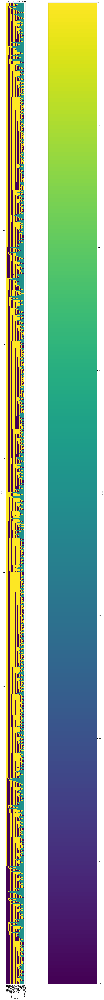

In [87]:
# just look at tangles of good physical and mental health
# go into the subtree of the tangle (0,-1), (1,-1), (2,-1), (3,-1), (4,-1), (5,-1), (6,-1), (7,1), (8,-1), (9,1), (10,-1)
subtree_matrix = sorted_matrix[(sorted_matrix[:, 0] == -1) & (sorted_matrix[:, 1] == -1) & (sorted_matrix[:, 2] == -1) & (sorted_matrix[:, 3] == -1) & (sorted_matrix[:, 4] == -1) & (sorted_matrix[:, 5] == -1) & (sorted_matrix[:, 6] == -1) & (sorted_matrix[:, 7] == 1) & (sorted_matrix[:, 8] == -1) & (sorted_matrix[:, 9] == 1) & (sorted_matrix[:, 10] == -1)][:, 11:]
print(len(subtree_matrix[:, 11:]))
plt.figure(figsize=(70, 150))
plt.imshow(subtree_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[11:])), features_ratio[11:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

In [88]:
unique_features = np.unique(subtree_matrix[:,:2], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[11:])), features_ratio[11:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

4


In [89]:
unique_features = np.unique(subtree_matrix[:,:3], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[11:])), features_ratio[11:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

6


In [90]:
unique_features = np.unique(subtree_matrix[:,:4], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[11:])), features_ratio[11:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

12


In [91]:
unique_features = np.unique(subtree_matrix[:,:5], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[11:])), features_ratio[11:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

23


In [92]:
unique_features = np.unique(subtree_matrix[:,:6], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[11:])), features_ratio[11:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

31


In [93]:
unique_features = np.unique(subtree_matrix[:,:7], axis=0)
# plot the tangle matrix
print(len(unique_features))
plt.figure(figsize=(70, 150))
plt.imshow(unique_features, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[11:])), features_ratio[11:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

49


142


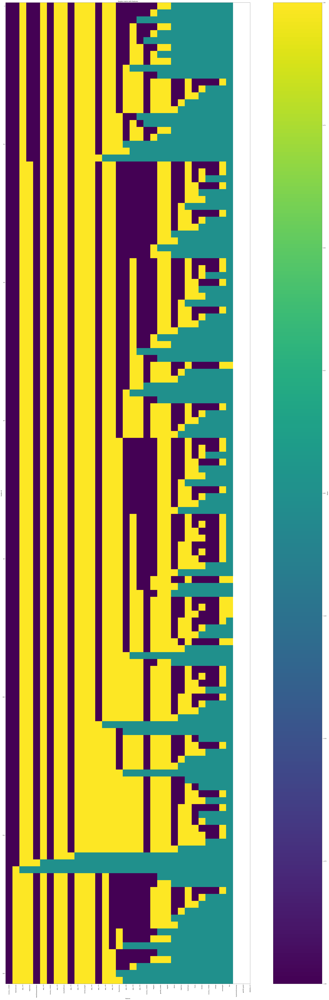

In [94]:
subtree_matrix_1 = subtree_matrix[(subtree_matrix[:, 0] == -1) & (subtree_matrix[:, 1] == -1) & (subtree_matrix[:, 2] == -1) & (subtree_matrix[:, 5] == -1) & (subtree_matrix[:, 6] == -1)][:, 7:]

# plot the tangle matrix
print(len(np.unique(subtree_matrix_1, axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_1, axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

In [95]:
subtree_matrix_2 = subtree_matrix[(subtree_matrix[:, 0] == -1) & (subtree_matrix[:, 1] == 1) & (subtree_matrix[:, 2] == -1) & (subtree_matrix[:, 4] == -1) & (subtree_matrix[:, 5] == -1)][:, 7:]

# plot the tangle matrix
print(len(np.unique(subtree_matrix_2, axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_2, axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

60


880


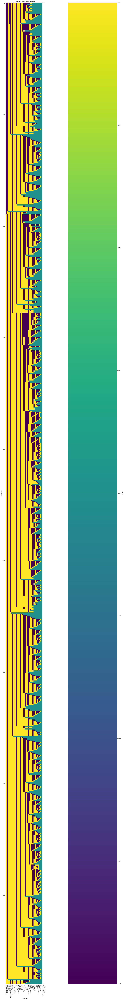

In [96]:
subtree_matrix_3 = subtree_matrix[(subtree_matrix[:, 0] == 1) & (subtree_matrix[:, 1] == -1) & (subtree_matrix[:, 2] == 1)  & (subtree_matrix[:, 5] == -1)][:, 7:]

# plot the tangle matrix
print(len(np.unique(subtree_matrix_3, axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3, axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

In [97]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:2], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:2], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

4


In [98]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:3], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:3], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

6


In [99]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:4], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:4], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

7


In [100]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:5], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:5], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

9


In [101]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:6], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:6], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

11


In [102]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:7], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:7], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

13


In [103]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:8], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:8], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

14


In [104]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:9], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:9], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

14


In [105]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:10], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:10], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

20


In [106]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:11], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:11], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

23


In [107]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:12], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:12], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

23


In [108]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:13], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:13], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

23


In [109]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:14], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:14], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

30


In [110]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:15], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:15], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

35


In [111]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:16], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:16], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

41


In [112]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:17], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:17], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

66


In [113]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:18], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:18], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

92


In [114]:
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:19], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:19], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

112


127


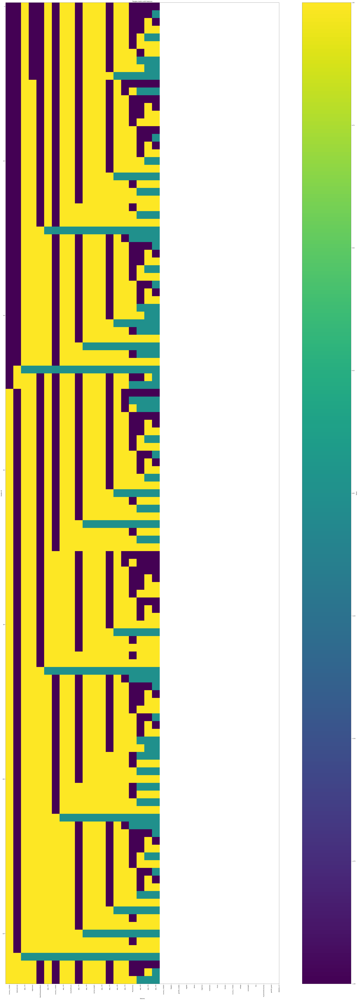

In [115]:
# age > 64!!

# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:20], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:20], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()

151


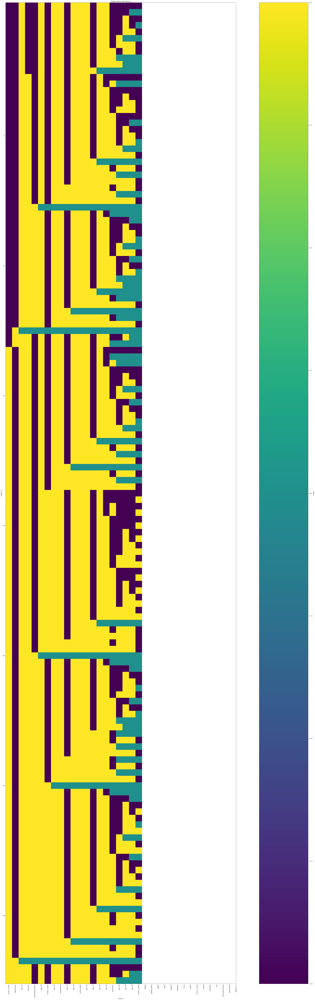

In [116]:
# income < 50000!!
# plot the tangle matrix
print(len(np.unique(subtree_matrix_3[:,:21], axis=0)))
plt.figure(figsize=(70, 150))
plt.imshow(np.unique(subtree_matrix_3[:,:21], axis=0), cmap='viridis', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('features')
plt.ylabel('tangles 40')
plt.xticks(np.arange(len(features_ratio[18:])), features_ratio[18:], rotation=90)
plt.title('Tangles matrix with features')
plt.show()